## Advanced Lane Finding Project

The goals for this project are:

- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Undistort the raw images.
- Create a thresholded binary image using data from different colorspaces, gradient data, etc.
- Apply a perspective transform to get a bird's eye view of the image.
- Find the lane pixels and use polynomial fit to get the lane boundary.
- Determine the lane curvature and position of the car from the center.
- Unwarp the image back to the original perspective.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.\

This notebook is divided into three sections as per the project rubric. 
1. Camera Calibration
2. Single Image Pipeline
3. Video Pipeline

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

### 1. Camera Calibration

In [2]:
# number of corners in horizontal and vertical directon
nx = 9
ny = 6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

w, h = 0, 0

# Step through the list of images and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny),None)

    # If found, add object points, image points
    if ret == True:
        h, w = gray.shape[::-1]
        objpoints.append(objp)
        imgpoints.append(corners)

# finally, use those points to generate camera matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (h, w), None, None)

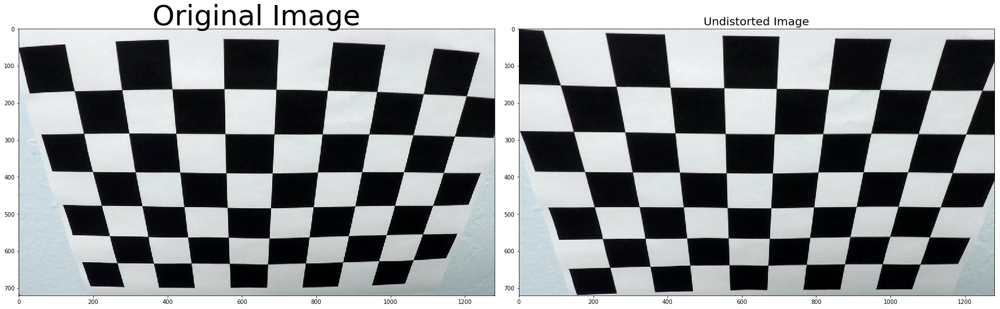

In [3]:
# undistort one checkerboard image using the found parameters
sampleImg = cv2.imread('./camera_cal/calibration2.jpg')
sampleUndistImg = cv2.undistort(sampleImg, mtx, dist, None, mtx)

# plot the undistorted and original image side by side
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sampleImg)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sampleUndistImg)
ax2.set_title('Undistorted Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Looks good! 

Now, moving on to creating a pipeline for the actual images on which we need to process. This is done in the following section.

### 2. Single Image Pipeline

For a single image pipeline, the following steps are implemented sequentially.

- Undistort the raw images.
- Create a thresholded binary image using data from different colorspaces, gradient data, etc.
- Apply a perspective transform to get a bird's eye view of the image.
- Find the lane pixels and use polynomial fit to get the lane boundary.
- Determine the lane curvature and position of the car from the center.
- Draw the lane information and unwarp the image back to the original perspective.

For the sake of satisfaction, each processing step is applied to all the test images as they represent different situations. They are shown below:

In [4]:
# function to display the six images, takes in an numpy array of images
def plotImages(imgArray, label='Test Image', cmap=None):
    fig, axes = plt.subplots(4, 2, figsize=(24, 22))

    for i, ax in enumerate(axes.flat):
        if (cmap is None):
            ax.imshow(imgArray[i])
        else:
            ax.imshow(imgArray[i], cmap=cmap)
        ax.set_title(label + ' {}'.format(i+1), fontsize=20)
    plt.show()

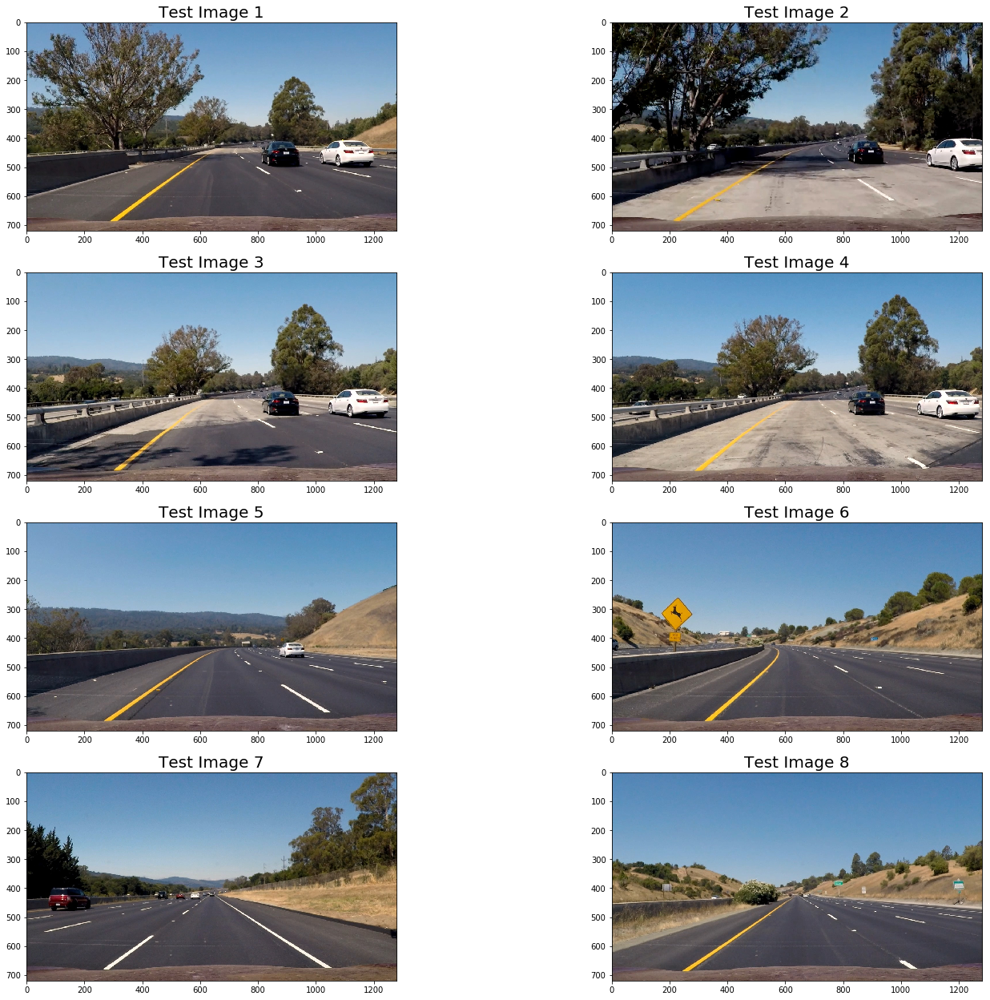

In [5]:
# display all 8 images in a grid.
testImgPath = glob.glob('test_images/*.jpg')

testImgs = []

for fname in testImgPath:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    testImgs.append(img)
        
plotImages(testImgs)

#### 2.1 Example of distortion corrected road image.

To undistort the images is one simple call to the cv2.undistort() using the camera parameters obtained in Section 1. 

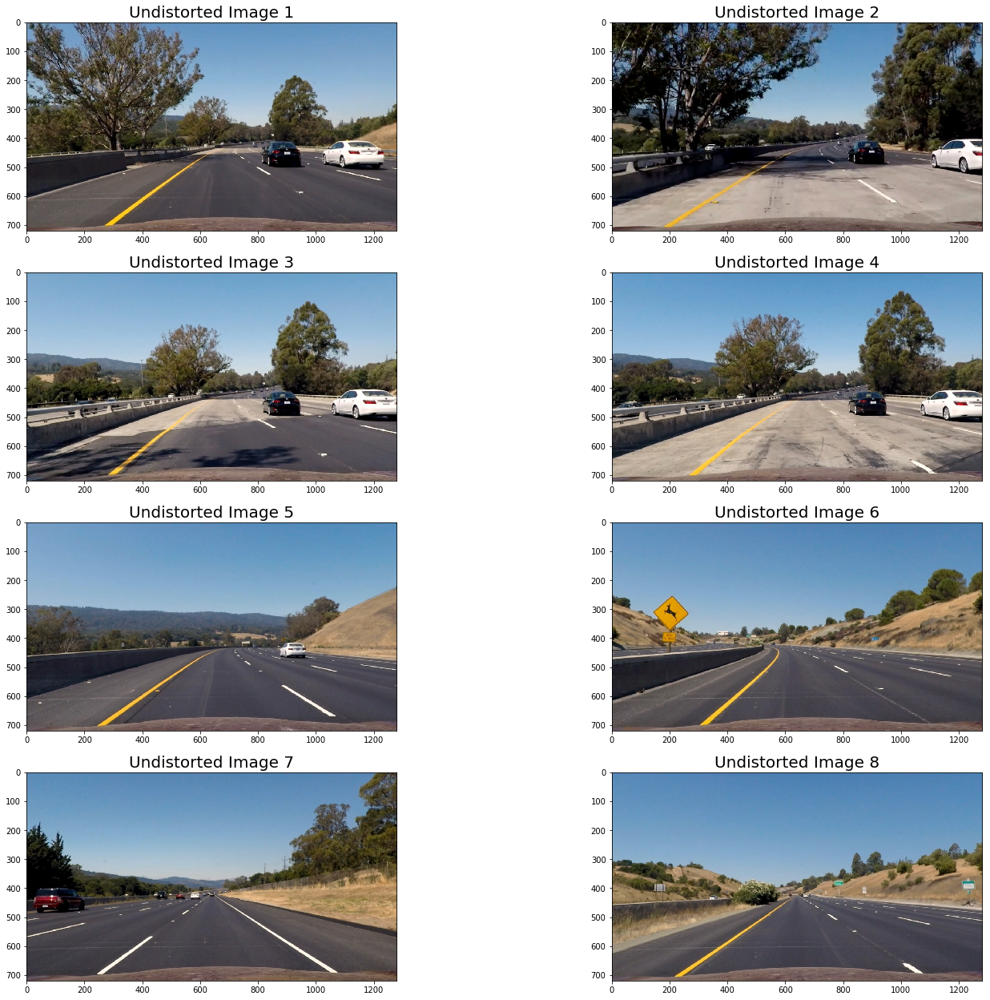

In [6]:
# undistort
testImgsUndist = [cv2.undistort(testImg, mtx, dist, None, mtx) for testImg in testImgs]

# plot the undistorted images
plotImages(testImgsUndist, label='Undistorted Image')

### 2.2 Create a thresholded binary image using data from different colorspaces, gradient data, etc.



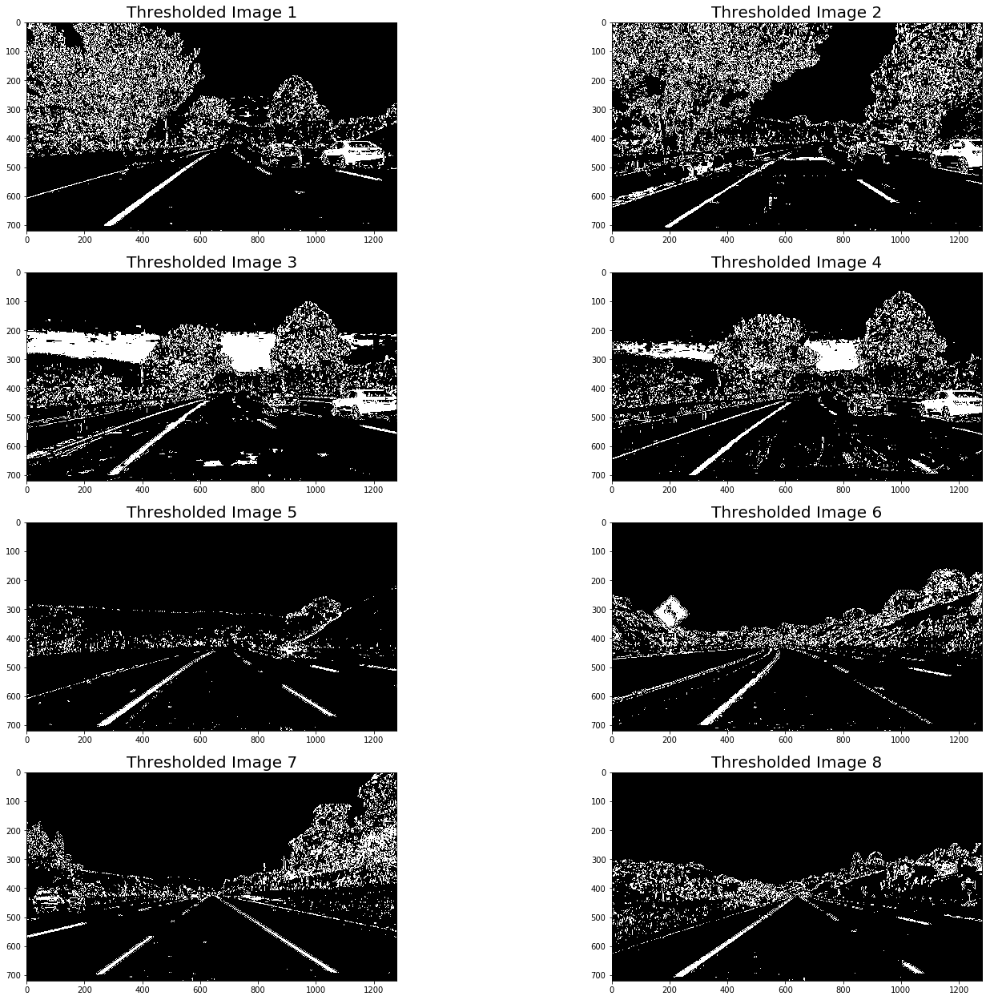

In [7]:
# From the lecture exercise, I realized that HSV colorspace and magnitude
# of gradient for grayscale are the best preprocessor to get robust edges.
def getBinaryImg(img, g_thresh=(0, 255), s_thresh=(0, 255), v_thresh=(0, 255)):
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=9) # Take the derivative in x
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=7) # Take the derivative in y
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely)) # Get the magnitude of gradient
    mag_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel)) # scale to range of 0 - 255
    
    # get the binary image based on the gradient magnitude
    mag_sobel_binary = np.zeros_like(mag_sobel)
    mag_sobel_binary[(mag_sobel >= g_thresh[0]) & (mag_sobel <= g_thresh[1])] = 1
    
    # get the binary image based on the V Channel 
    v_channel_binary = np.zeros_like(v_channel)
    v_channel_binary[(v_channel > v_thresh[0]) & (v_channel <= v_thresh[1])] = 1

    # get the binary image based on the S Channel 
    s_channel_binary = np.zeros_like(s_channel)
    s_channel_binary[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
#     color_binary = np.dstack((mag_sobel_binary, v_channel_binary, s_channel_binary))
    # combine all three binary images to get robust edges at lane lines
    thresh_binary = np.zeros(img.shape[:-1])
    thresh_binary[(s_channel_binary == 1) | (v_channel_binary == 1) | (mag_sobel_binary == 1)] = 1
    
    return thresh_binary
    
testUndistThresh = [getBinaryImg(testImg, g_thresh=(20, 60), s_thresh=(160, 220), v_thresh=(220, 255)) \
                    for testImg in testImgsUndist]

# Plot the result
plotImages(testUndistThresh, label='Thresholded Image', cmap='gray')

At this point, the threshold image looks pretty good. There are some unwanted patches but they can be filtered out by creating a mask in the next section.

### 2.3 Apply a perspective transform to get a bird's eye view of the image.

This step is necessary to validate that the lane lines are parallel. Moreover, before applying perspective transform, it can be a good idea to mask the image by choosing an appropriate polygon, and then aply to transformation to get more clear lane lines in the first place. (Currently, not using the mask. Can use it if needed for refinement.)

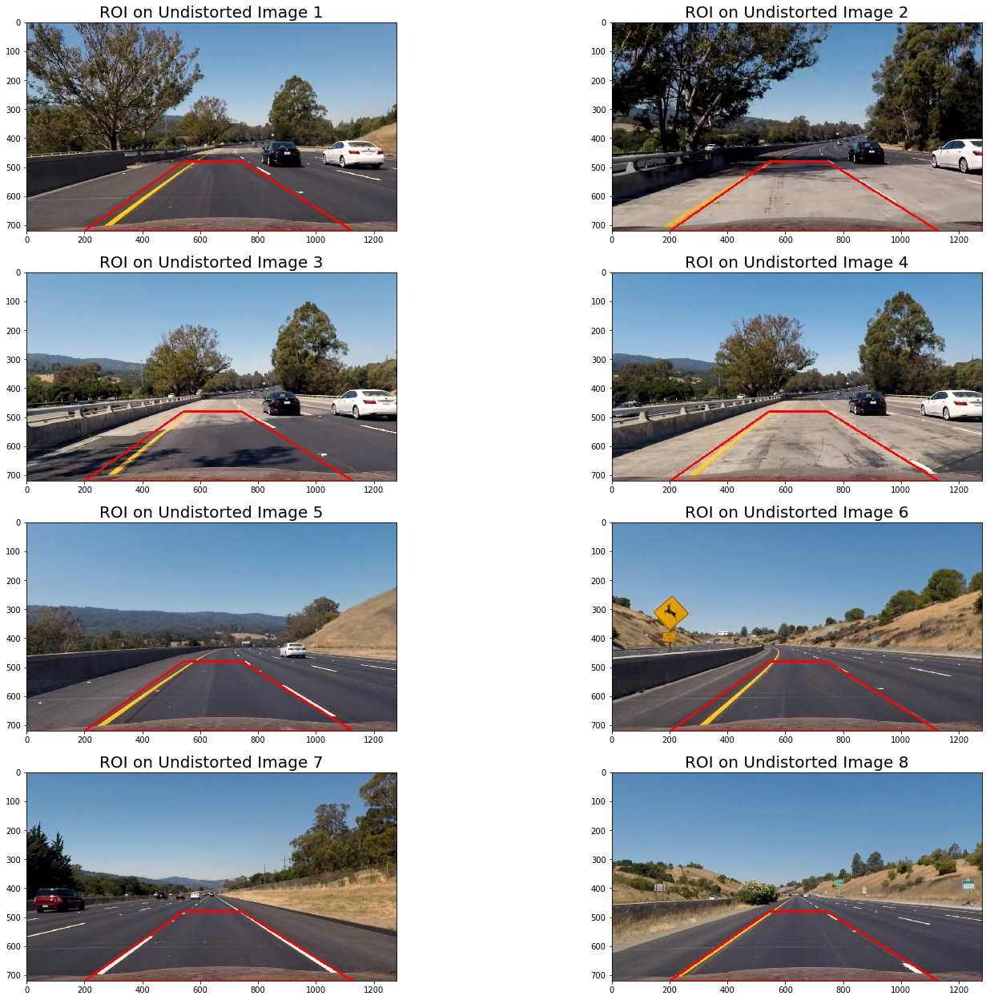

In [8]:
# Choose the points in the original image perspective by visual inspection
# Maybe there are automatic ways to find it but I couldn't think of any
img_size = img.shape[:-1]
src = np.float32([(200, 720),      # bottom left
                  (542, 480),      # top left
                  (742, 480),      # top right
                  (1127, 720)])    # bottom right

# destination points in the same sequence
dst = np.float32([(320, 720),
                  (320, 0),
                  (960, 0),
                  (960, 720)])

# Draw the polygon with the src points as vertices
pts = src.astype(np.int32)
pts = pts.reshape((-1,1,2))

testImgsRoi = [np.copy(testImg) for testImg in testImgsUndist]
for testImgRoi in testImgsRoi:
    cv2.polylines(testImgRoi, [pts], True, (255, 0, 0), 5)

# plot the images with ROI
plotImages(testImgsRoi, label='ROI on Undistorted Image')

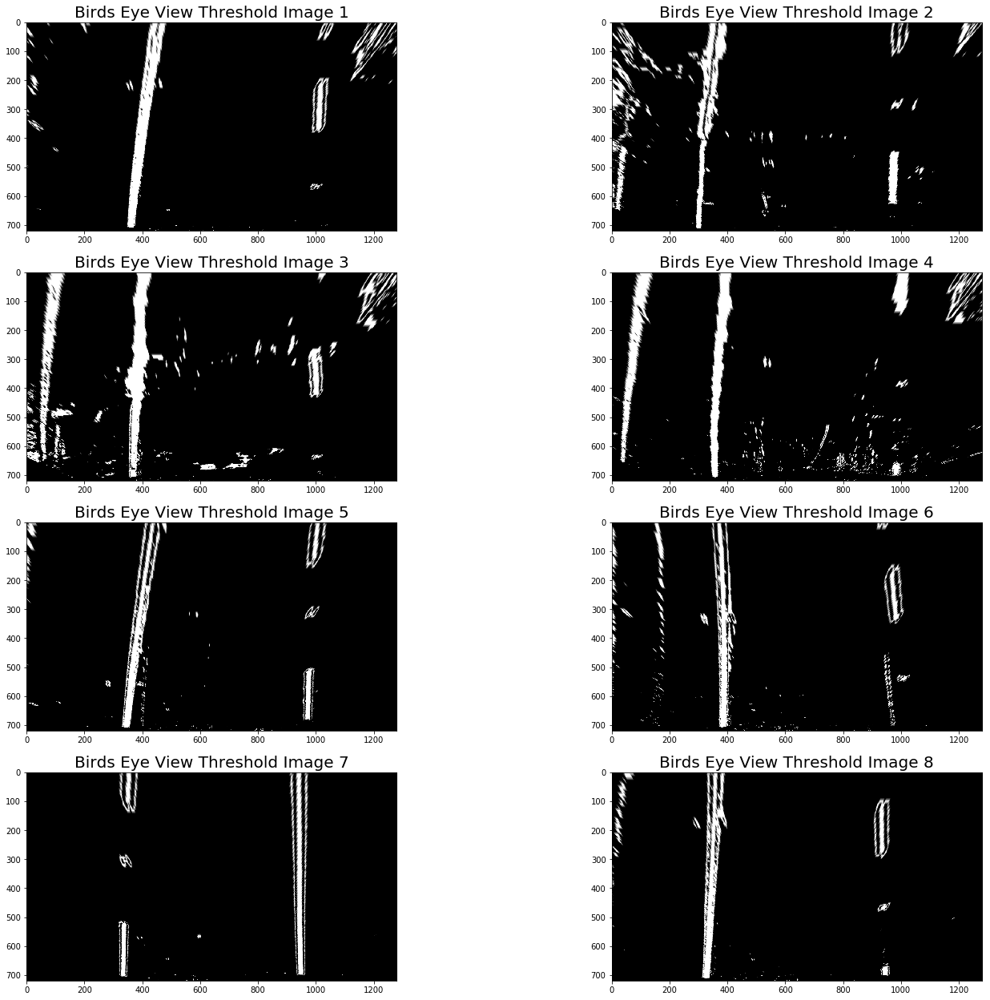

In [9]:
# Get the perspective transform matrices. They will be used to transform the image and back
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

# Function to get the perspective transform
def warp(img, M, h, w):
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped

# Unwarp the undistorted threshold image
testImgsUnwarpThresh = [warp(img, M, img_size[0], img_size[1]) for img in testUndistThresh]

# plot them
plotImages(testImgsUnwarpThresh, label='Birds Eye View Threshold Image', cmap='gray')

After the perspectivetransform, the lane lines look almot parallel. Thus, this will be helpful in finding the polynomial fit perfectly.

#### 2.4 Find the lane pixels and use polynomial fit to get the lane boundary.

For this part of the pipeline, I will find the histogram of the pixels located on the bottom half of the binary image. Once, the peakes, which also represent lane line positions, are obtained, a sliding window is applied around the peak position to find the polynomial fit to get the lane line equation parameters.

In [10]:
def getPolyfit(img, nWin=9, winMargin=100, minPixels=50, generateVis=False):
    '''
    Most of the code from class notes is reused
    img - binary warped image corresponding to lanes
    nWin - the number of sliding windows
    winMargin - the width of the windows +/- winMargin
    minPixels - minimum number of pixels found to recenter window
    '''
    
    # histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # height of windows
    window_height = np.int(img.shape[0]/nWin)
    
    # the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    #  Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))
    
    # Step through the windows one by one
    for window in range(nWin):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - winMargin
        win_xleft_high = leftx_current + winMargin
        win_xright_low = rightx_current - winMargin
        win_xright_high = rightx_current + winMargin
        if generateVis:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,1,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,1,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minPixels:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minPixels:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    if generateVis:
        # Generate x and y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        left_pts = np.vstack((left_fitx, ploty)).T
        right_pts = np.vstack((right_fitx, ploty)).T
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]
        cv2.polylines(out_img, np.int32([left_pts]), False, color=(0, 1, 0), thickness=5)
        cv2.polylines(out_img, np.int32([right_pts]), False, color=(0, 1, 0), thickness=5)
        
        return out_img, left_fit, right_fit
    
    return left_fit, right_fit

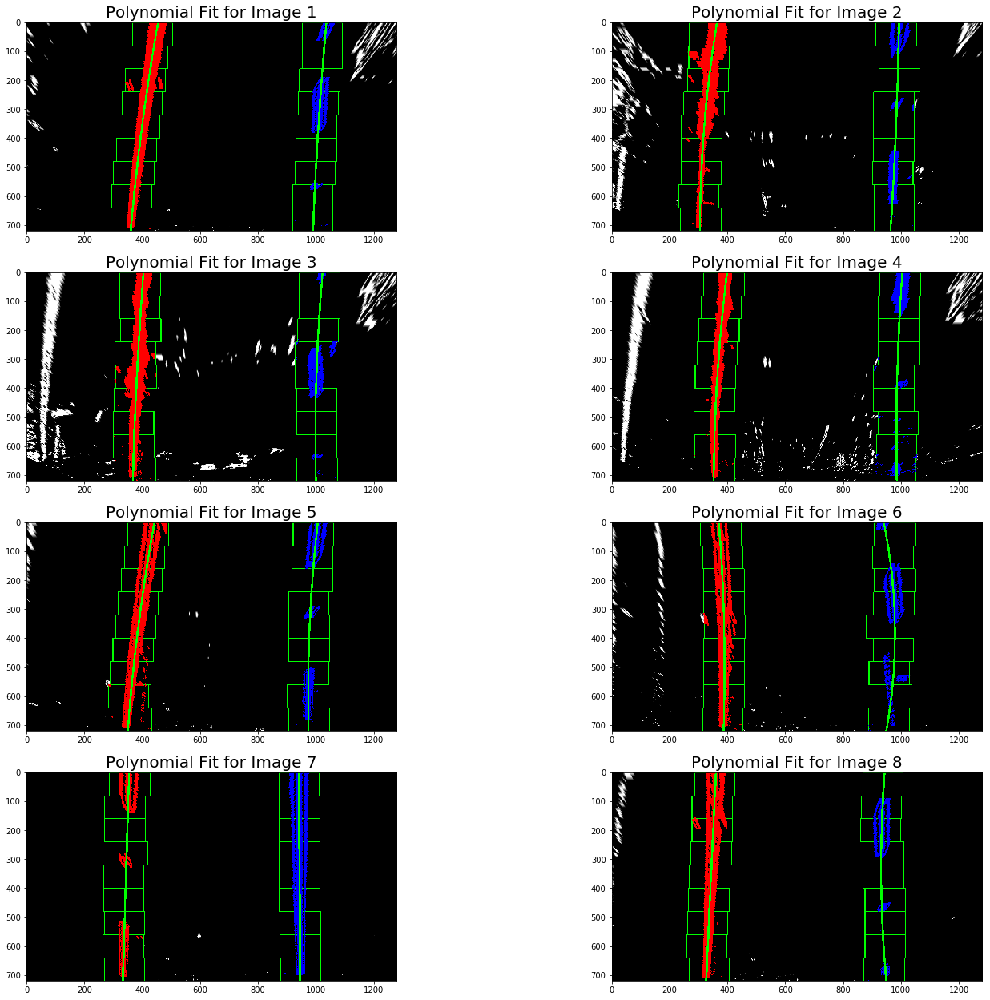

In [11]:
# get the visualization for each test image
polyFitLaneImgs = [getPolyfit(img, winMargin=70, minPixels=60, generateVis=True)[0] for img in testImgsUnwarpThresh]

# plot them
plotImages(polyFitLaneImgs, label='Polynomial Fit for Image')

Amazing! Now that the sliding window works, for the next image, a simpler searchin the neighborhood of the previously fit values will be helpful to determine the lane line parameters. This can be done by the following function.

In [12]:
def getLaneLines(img, leftFit, rightFit, pixelMargin=100, generateVis=False):
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "img")
    # It's now much easier to find line pixels!
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    pixelMargin = 100
    left_lane_inds = ((nonzerox > (leftFit[0]*(nonzeroy**2) + leftFit[1]*nonzeroy + 
    leftFit[2] - pixelMargin)) & (nonzerox < (leftFit[0]*(nonzeroy**2) + 
    leftFit[1]*nonzeroy + leftFit[2] + pixelMargin))) 

    right_lane_inds = ((nonzerox > (rightFit[0]*(nonzeroy**2) + rightFit[1]*nonzeroy + 
    rightFit[2] - pixelMargin)) & (nonzerox < (rightFit[0]*(nonzeroy**2) + 
    rightFit[1]*nonzeroy + rightFit[2] + pixelMargin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    leftFit = np.polyfit(lefty, leftx, 2)
    rightFit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    leftFitx = leftFit[0]*ploty**2 + leftFit[1]*ploty + leftFit[2]
    rightFitx = rightFit[0]*ploty**2 + rightFit[1]*ploty + rightFit[2]
    
    if generateVis:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((img, img, img))
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([leftFitx-pixelMargin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([leftFitx+pixelMargin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([rightFitx-pixelMargin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([rightFitx+pixelMargin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,1, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,1, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        
        left_pts = np.vstack((leftFitx, ploty)).T
        right_pts = np.vstack((rightFitx, ploty)).T
        cv2.polylines(result, np.int32([left_pts]), False, color=(0.7, 0.7, 0.), thickness=5)
        cv2.polylines(result, np.int32([right_pts]), False, color=(0.7, 0.7, 0.1), thickness=5)
        
        return result, leftFitx, rightFitx, leftFit, rightFit
    
    return leftFitx, rightFitx, leftFit, rightFit

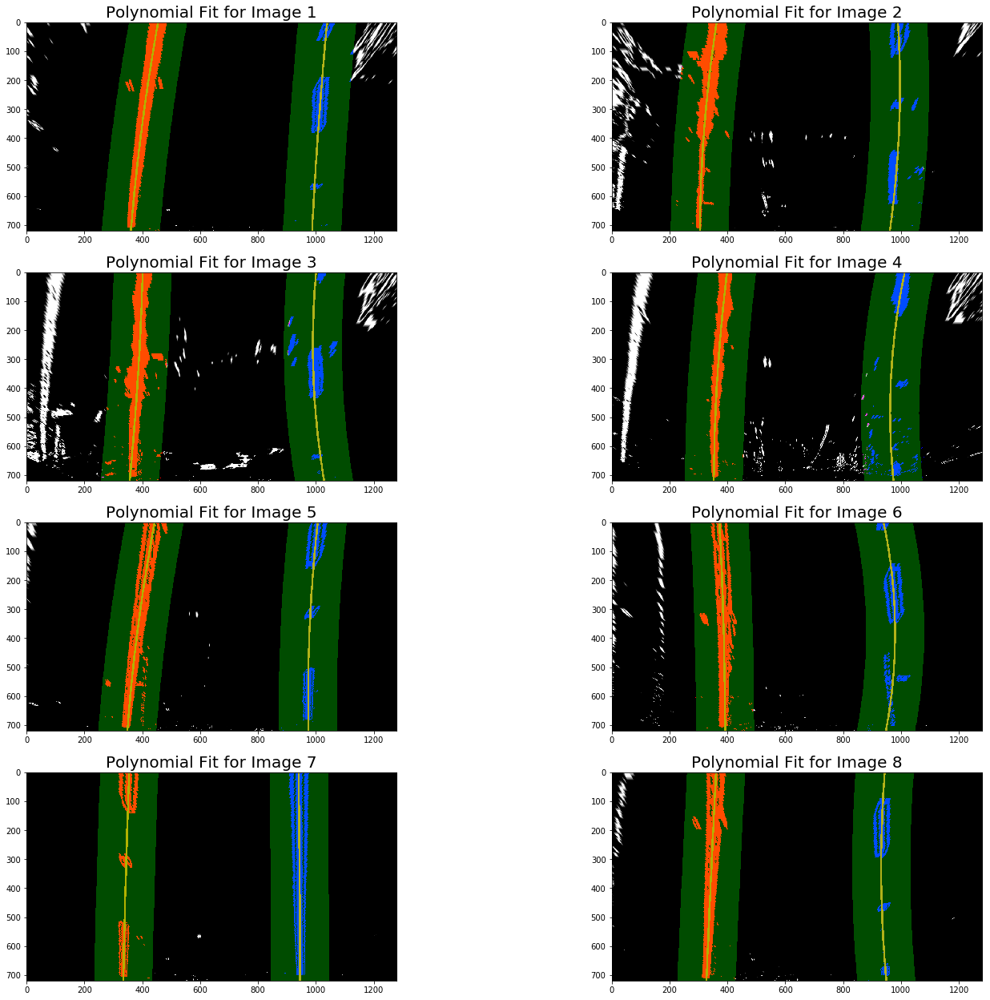

In [13]:
# get the visualization for each test image
prevParams = [(getPolyfit(img, winMargin=60, minPixels=60)) for img in testImgsUnwarpThresh]
polyFitLaneFTParams = [getLaneLines(res[0], leftFit=res[1][0], rightFit=res[1][1], pixelMargin=100, generateVis=True) 
                     for res in zip(testImgsUnwarpThresh, prevParams)]

# plot them
plotImages([res[0] for res in polyFitLaneFTParams], label='Polynomial Fit for Image')

#### 2.5 Determine the lane curvature and position of the car from the center.

To determine the radius of curvature of the lane and the offset from the center, the pixel space values are converted to meters by using the information of the width of the lane width and distance between the two lines. 

Then to obtain the radius of curvature, the polynomial fit coeffecients are applied at the midpoint of the height. This is done for both the left and right lines and then averaged.

To obtained the offset, the midpoint is found from the polynomial fit points in X direction and then the actual midpoint in X direction is subtracted.

In [14]:
def getCurvatureAndOffset(leftx, rightx, xm=3.7, ym=30, width=640, height=720):
    ploty = np.linspace(0, height-1, num=height)# to cover same y-range as image
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = xm/width
    ym_per_pix = ym/height

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # I have chosen the center of the image height as the point of evaluation
    y_eval_curve = height/2
    y_eval_offset = 700
    midx = 640
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_curve*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_curve*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # take the average of left and right curvature to have a more robust curvature
    curverad = (left_curverad + right_curverad) / 2
    
    # calculate the distance from the center
    left_fit_x = np.polyfit(ploty, leftx, 2)
    right_fit_x = np.polyfit(ploty, rightx, 2)
    x_left_pix = left_fit_x[0]*(y_eval_offset**2) + left_fit_x[1]*y_eval_offset + left_fit_x[2]
    x_right_pix = right_fit_x[0]*(y_eval_offset**2) + right_fit_x[1]*y_eval_offset + right_fit_x[2]

    offset = ((x_left_pix + x_right_pix)/2.0 - midx) * xm_per_pix
    
    return curverad, offset

In [15]:
curvatureData = [getCurvatureAndOffset(res[1], res[2]) for res in polyFitLaneFTParams]
for data in curvatureData:
    print("Radius of curvature: {0}m, Distance from center: {1}m".format(data[0], data[1]))

Radius of curvature: 3543.1474638204036m, Distance from center: 0.20026635544535448m
Radius of curvature: 1269.1497612500873m, Distance from center: -0.041533507057037386m
Radius of curvature: 1984.3972811472868m, Distance from center: 0.29584637988873874m
Radius of curvature: 1278.6379746426096m, Distance from center: 0.1210862701286112m
Radius of curvature: 1824.4382779376083m, Distance from center: 0.12347510906528898m
Radius of curvature: 2337.391374030669m, Distance from center: 0.17147810211746098m
Radius of curvature: 66189.68157322511m, Distance from center: -0.0024710243237592877m
Radius of curvature: 10488.786782192565m, Distance from center: -0.021411791579512902m


#### 2.6 Draw the lane information and unwarp the image back to the original perspective.

Once the lane information is produced, everything canbe put together in the original image to display the results for verification.

In [16]:
def drawOutput(image, warped, Minv, polyfitPts, curvatureData):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    pts_left = np.array([np.transpose(np.vstack([polyfitPts[0], ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([polyfitPts[1], ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, unwarped, 0.3, 0)
    
    # Add the information about the lane on top left corner
    cv2.putText(result,'Radius of Curvature: %.2fm' % curvatureData[0], (20,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    offset = curvatureData[1]*100
    if offset < 0:
        text = 'left'
    else:
        text = 'right'
    cv2.putText(result,'Distance From Center: %.2fcm %s' % (np.absolute(offset), text), (20,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    return result

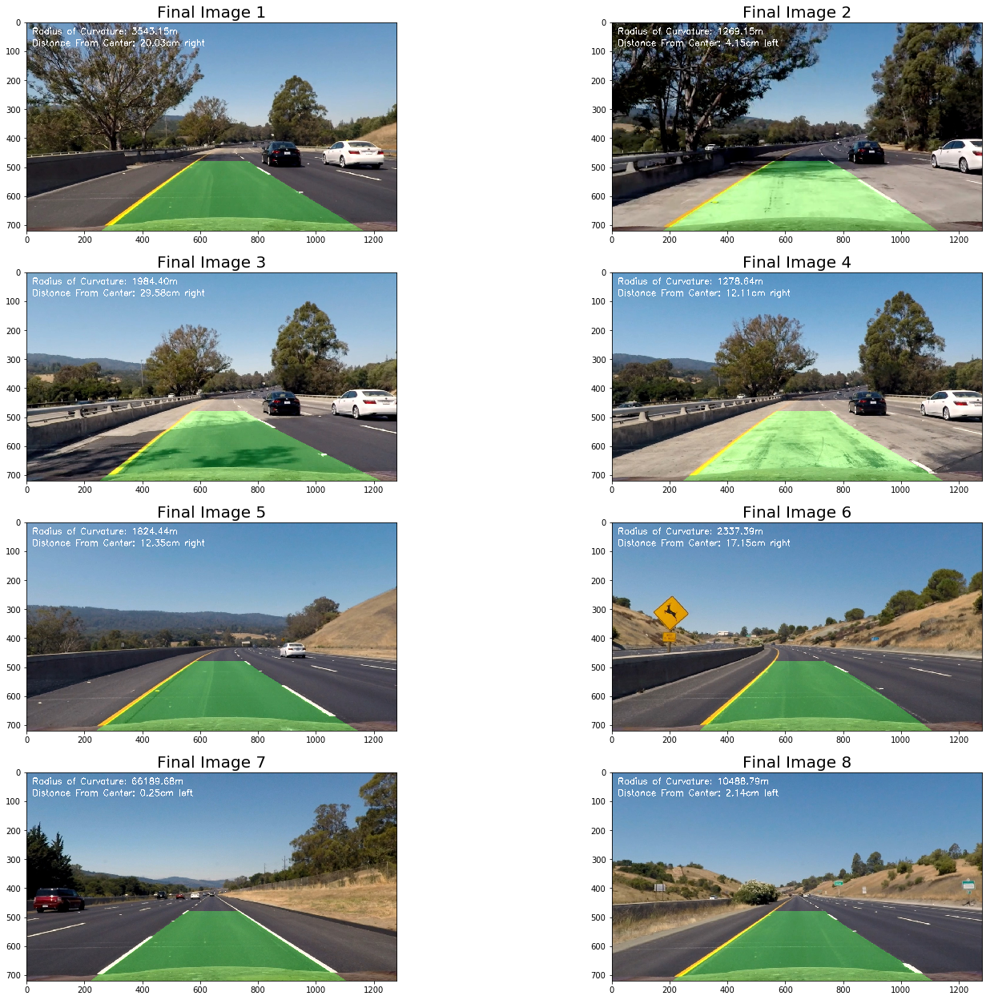

In [17]:
finalImgs = [drawOutput(res[0], res[1], Minv, res[2][1:], res[3]) for res in zip(testImgsUndist, testImgsUnwarpThresh, polyFitLaneFTParams, curvatureData)]

plotImages(finalImgs, label="Final Image")

Looks very good! Now, the last part is to put it all together. For this, I have decided to use a class called Lane(). This will keep track of the previous lane lines result and used them in case the parameters obtained in the current frame are not useful. I have also added the calculation of radius of curvature and position from center inside this class and they will be updated every 10 frames.

### 3. Video Pipeline

For the processing of the video, a `Line()` class is used to keep track of the best polynomial fits and corresponding points so that if the lane lines in the current frame are not parallel, then the best values are used instead. To check if the lines are parallel, the difference in the distance between the top and bottom of the lines is used. If that is more than 100 pixels, then the lines are deemed as not parallel. Moreover, if the lines are not parallel in the 5 consequitive frames, the lane line finding pipeine will reset to the window search for polynomial fit.

In [28]:
from collections import deque
# Define a class to receive the characteristics of each lane line detections
class Line():
    def __init__(self, nPrevRes=10, nReset=5):
        # x values of the last n fits of the left line
        self.recent_xfitted_left = deque([], maxlen=nPrevRes)
        # x values of the last n fits of the right line
        self.recent_xfitted_right = deque([], maxlen=nPrevRes)
        # average x values of the fitted left line over the last n iterations
        self.bestx_left = np.zeros((720,), dtype=np.float32)
        # average x values of the fitted right line over the last n iterations
        self.bestx_right = np.zeros((720,), dtype=np.float32)
        # polynomial coefficients of the last n iterations for left line
        self.recent_left_fit = deque([], maxlen=nPrevRes)
        # polynomial coefficients of the last n iterations for right line
        self.recent_right_fit = deque([], maxlen=nPrevRes)
        # polynomial coefficients for left line averaged over the last n iterations
        self.best_fit_left = np.zeros((3,), dtype=np.float32)
        # polynomial coefficients for right line averaged over the last n iterations
        self.best_fit_right = np.zeros((3,), dtype=np.float32)
        # polynomial coefficients for the most recent left fit
        self.current_fit_left = [np.array([False])] 
        # polynomial coefficients for the most recent right fit
        self.current_fit_right = [np.array([False])]  
        # radius of curvature of the line in some units
        self.radius_of_curvature = None 
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # was the line detected in the last iteration?
        self.detected = False    
        # Define the variable to check if the first frame is to be processed or not
        self.processFirstFrame = True
        self.nResetFrames = nReset
        self.nBadFrames = 0
       
    # function to update the line parameters
    def updateLines(self, leftFit, rightFit, leftFitx, rightFitx):
        if self.detected:
            self.recent_left_fit.append(leftFit)
            self.recent_right_fit.append(rightFit)
            self.recent_xfitted_left.append(leftFitx)
            self.recent_xfitted_right.append(rightFitx)
            
            self.best_fit_left = np.zeros((3,), dtype=np.float32)
            self.best_fit_right = np.zeros((3,), dtype=np.float32)
            self.bestx_left = np.zeros((720,), dtype=np.float32)
            self.bestx_right = np.zeros((720,), dtype=np.float32)
            c = len(self.recent_left_fit)
            for i in range(0, c):
                self.best_fit_left += self.recent_left_fit[i]
                self.best_fit_right += self.recent_right_fit[i]
                self.bestx_left += self.recent_xfitted_left[i]
                self.bestx_right += self.recent_xfitted_right[i]
                
            self.best_fit_left *= 1/c
            self.best_fit_right *= 1/c
            self.bestx_left *= 1/c
            self.bestx_right *= 1/c
            
        else:
            self.recent_left_fit.append(self.best_fit_left)
            self.recent_right_fit.append(self.best_fit_right)
            self.recent_xfitted_left.append(self.bestx_left)
            self.recent_xfitted_right.append(self.bestx_right)

In [39]:
# Define the line class for left and right lane lines
line = Line(nPrevRes=10, nReset=5)
def processImage(img):
    # Step 1: Undistort the image
    img = cv2.undistort(img, mtx, dist, None, mtx)

    # Step 2: Convert to the binary image
    binImg = getBinaryImg(img, g_thresh=(20, 60), s_thresh=(160, 220), v_thresh=(220, 255))

    # Step 3: Warp the binary image to get the bird's eye view
    warpedImg = warp(binImg, M, img_size[0], img_size[1])

    # Step 4: Get the lane line parameters for the warped image
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    if line.processFirstFrame or (line.nBadFrames >= line.nResetFrames):
        # if the line.processFirstFrame is true, then get the parameters using window search
        left_fit, right_fit = getPolyfit(warpedImg, winMargin=70, minPixels=60)

        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        line.detected = True
        line.updateLines(left_fit, right_fit, left_fitx, right_fitx)

        line.processFirstFrame = False
        line.nBadFrames = 0
    else:
        # if the line.processFirstFrame is false, then get the parameters searching 
        # in the neighborhood of previously found result
        left_fitx, right_fitx, left_fit, right_fit = getLaneLines(warpedImg, line.best_fit_left, line.best_fit_right)

        # some sanity check, if fails, then increment line.nBadFrames
        # firt sanity check is to find if the lane lines are almost parallel
        # this is done by finding the difference between the distance between 
        # the top and the bottom coordinates. if that is more than 60, then 
        # the lines are not parallel
        topDist = left_fitx[0] - right_fitx[0]
        botDist = left_fitx[719] - right_fitx[719]
        if abs(topDist- botDist) > 60:
            line.detected = False
#             line.nBadFrames += 1
        else:
            line.detected = True

        line.updateLines(left_fit, right_fit, left_fitx, right_fitx)

    roc, offset = getCurvatureAndOffset(line.bestx_left, line.bestx_right)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warpedImg).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([line.bestx_left, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([line.bestx_right, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)

    # Add the information about the lane on top left corner
    cv2.putText(result, 'Radius of Curvature: %.2fm' % roc, (20,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    offset = offset*100
    if offset < 0:
        text = 'left'
    else:
        text = 'right'
    cv2.putText(result, 'Distance From Center: %.2fcm %s' % (np.absolute(offset), text), (20,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    return result

In [40]:
from moviepy.editor import VideoFileClip
videoOutput = 'project_video_output.mp4'
videoInput = VideoFileClip('project_video.mp4')#.subclip(1,10)
processedVideo = videoInput.fl_image(processImage)
%time processedVideo.write_videofile(videoOutput, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [03:53<00:00,  5.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min, sys: 47.1 s, total: 4min 47s
Wall time: 3min 55s


In [27]:
from moviepy.editor import VideoFileClip
videoOutput1 = 'challenge_video_output.mp4'
videoInput1 = VideoFileClip('challenge_video.mp4')#.subclip(1,10)
processedVideo1 = videoInput1.fl_image(processImage)
%time processedVideo1.write_videofile(videoOutput1, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [01:35<00:00,  5.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 35s, sys: 19 s, total: 1min 54s
Wall time: 1min 36s
